STMAE Project number 4

In [3]:
# We will start by importing the required libraries
import numpy as np
import os
import matplotlib.pyplot as plt
from pathlib import Path
import librosa
import sklearn
import tensorflow as tf
import pandas as pd
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
plt.style.use("seaborn-v0_8")
tf.config.threading.set_intra_op_parallelism_threads(8)  
tf.config.threading.set_inter_op_parallelism_threads(8)  

Number of files: 100
    filename label
0  bus01.wav   bus
1  bus02.wav   bus
2  bus03.wav   bus
3  bus04.wav   bus
4  bus05.wav   bus
label
bus              10
busystreet       10
office           10
openairmarket    10
park             10
quietstreet      10
restaurant       10
supermarket      10
tube             10
tubestation      10
Name: count, dtype: int64


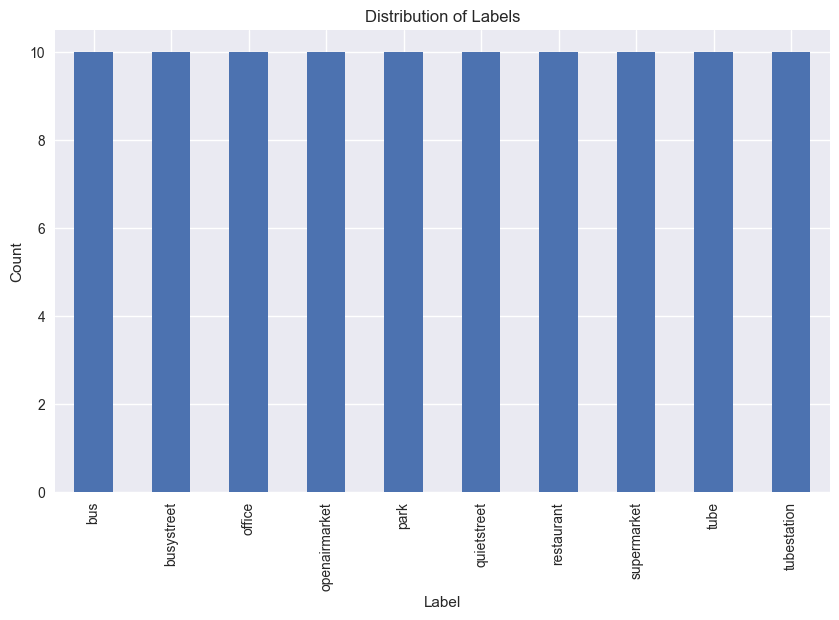

In [8]:
# We will then import the dataset 
directory = 'scenes_stereo'
file_list = [f for f in os.listdir(directory) if f.endswith('.wav')] # extractinf the files 
file_list.sort()
print(f"Number of files: {len(file_list)}") # check if they are all present

def extract_label(filename):
    # Since the filename is in the format "labelXX.wav":
    unique_label = filename.split('0')[0]  # Extract the label part
    unique_label = unique_label.split('1')[0]  # Extract the label part
    
    return unique_label

# Extract labels from filenames
labels = [extract_label(f) for f in file_list]

# Create a DataFrame with filenames and labels
df = pd.DataFrame({'filename': file_list, 'label': labels})

# Display the first few rows of the DataFrame
print(df.head())

# Check the distribution of labels
label_counts = df['label'].value_counts()
print(label_counts)
# Plot the distribution of labels
plt.figure(figsize=(10, 6))
label_counts.plot(kind='bar')
plt.title('Distribution of Labels')
plt.xlabel('Label')
plt.ylabel('Count')
plt.show()
    
    


The first step for developing our pipeline is to understand what feature extraction better suits our task, we will listen to some audio files and try different representation

File: park03.wav


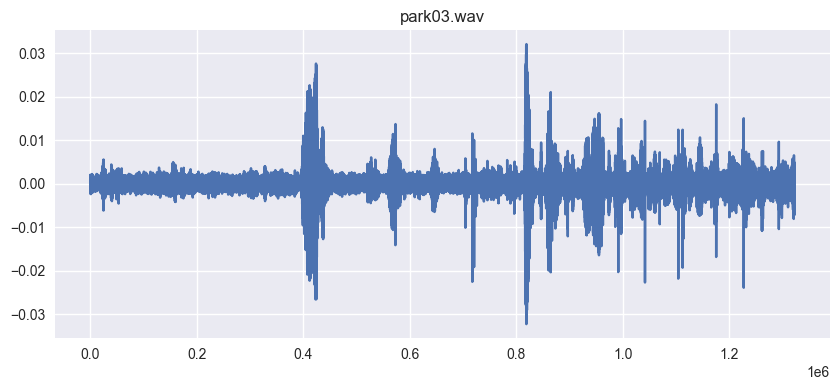

File: quietstreet08.wav


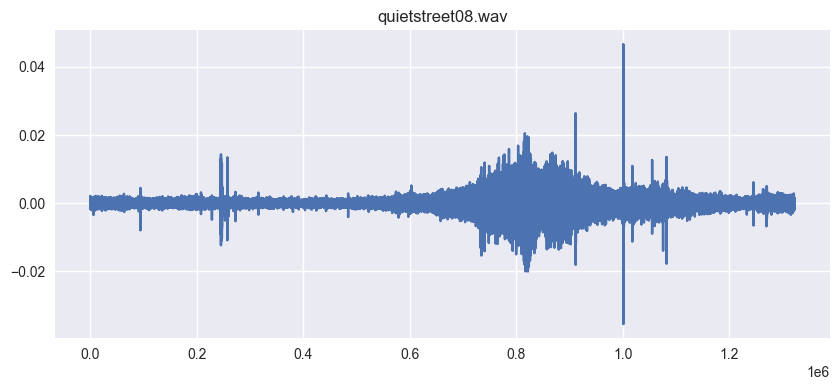

File: park04.wav


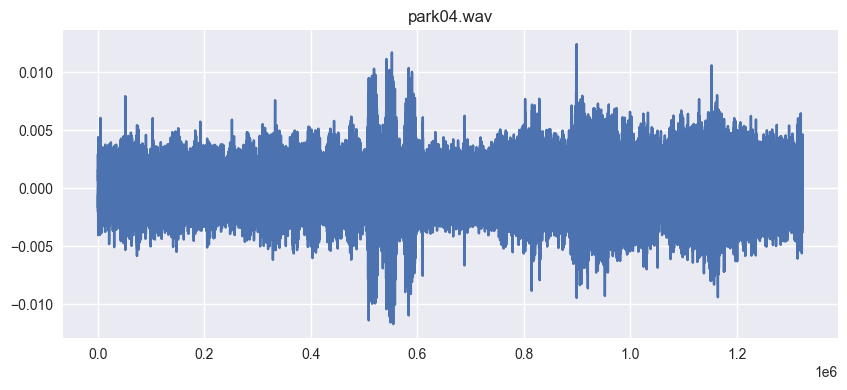

File: supermarket09.wav


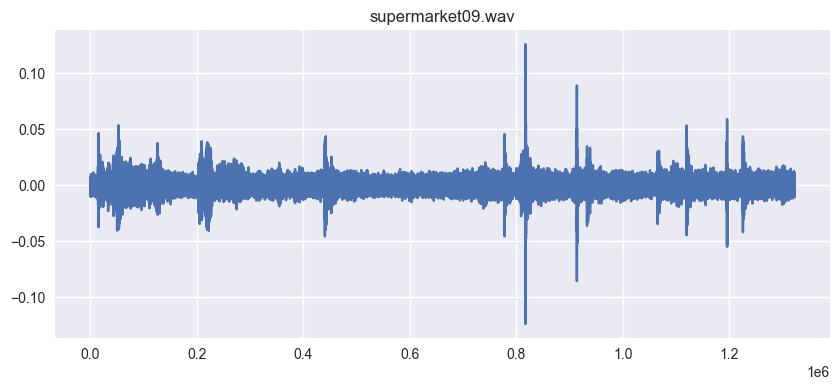

File: busystreet06.wav


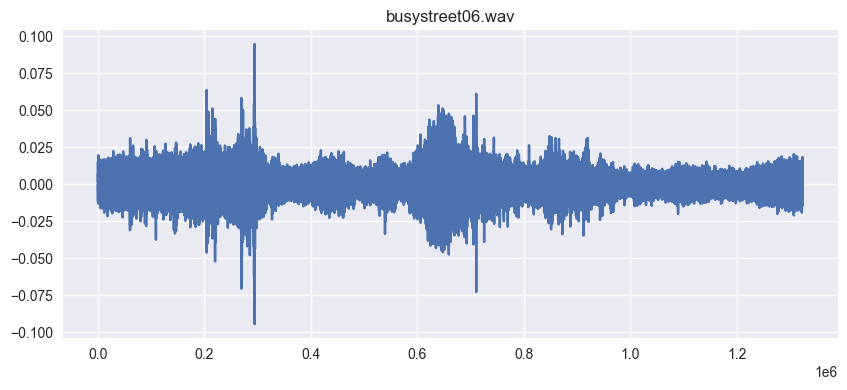

In [ ]:
import random
from IPython.display import Audio, display

# First we listen to some random files 
random_files = random.sample(file_list, 5)

for file in random_files:
    file_path = os.path.join(directory, file)
    y, sr = librosa.load(file_path, sr=None)
    print(f"File: {file}")
    display(Audio(y, rate=sr))  # Play the audio
    plt.figure(figsize=(10, 4))
    plt.title(file)
    plt.plot(y)
    plt.show()



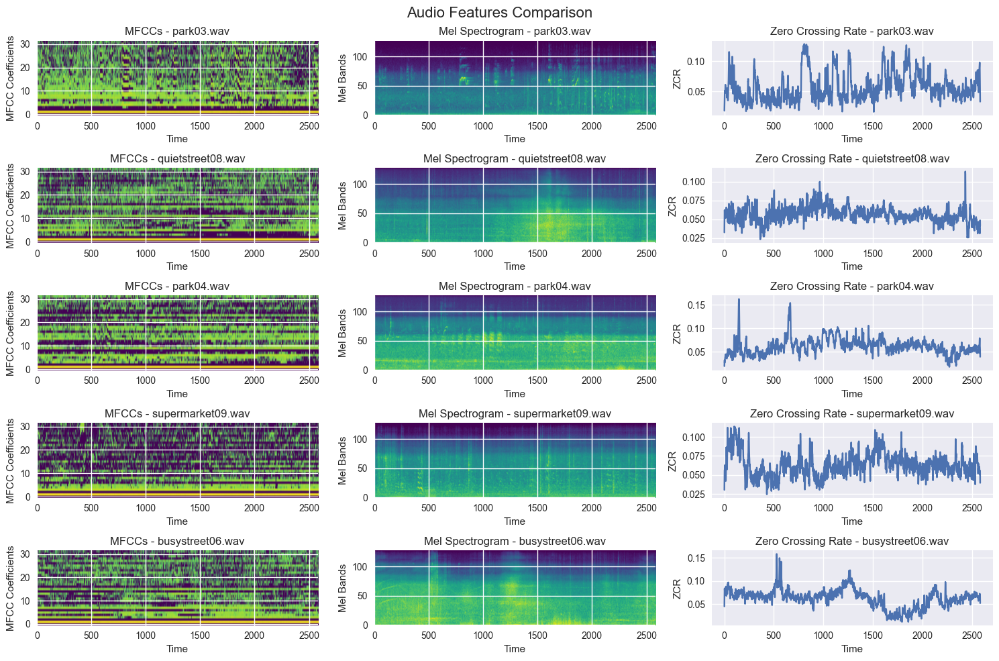

In [20]:
# We will then extract the features from the audio files and compare them

def extract_features(random_files):
    # Load the audio file
    y, sr = librosa.load(file_path, sr=None)
    
    # Extract features
    mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=32)
    mfccs = librosa.power_to_db(mfccs, ref=np.max)  # Convert to decibels
    mel_spectrogram = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128)
    zcr = librosa.feature.zero_crossing_rate(y)
    
    return mfccs, mel_spectrogram, zcr

# Extract features for all files
features_rnd = []

for file in random_files:
    file_path = os.path.join(directory, file)
    mfccs, mel_spectrogram, zcr = extract_features(file_path)
    features_rnd.append((mfccs, mel_spectrogram, zcr))

# Plot the the features in groups to compare them
def plot_features(features_rnd, random_files):
    fig, axs = plt.subplots(len(random_files), 3, figsize=(15, 10))
    fig.suptitle('Audio Features Comparison', fontsize=16)
    
    for i, (mfccs, mel_spectrogram, zcr) in enumerate(features_rnd):
        # Plot MFCCs
        axs[i, 0].imshow(mfccs, aspect='auto', origin='lower', cmap='viridis')
        axs[i, 0].set_title(f'MFCCs - {random_files[i]}')
        axs[i, 0].set_xlabel('Time')
        axs[i, 0].set_ylabel('MFCC Coefficients')
        
        # Plot Mel Spectrogram
        axs[i, 1].imshow(librosa.power_to_db(mel_spectrogram), aspect='auto', origin='lower', cmap='viridis')
        axs[i, 1].set_title(f'Mel Spectrogram - {random_files[i]}')
        axs[i, 1].set_xlabel('Time')
        axs[i, 1].set_ylabel('Mel Bands')
        
        # Plot Zero Crossing Rate
        axs[i, 2].plot(zcr[0])
        axs[i, 2].set_title(f'Zero Crossing Rate - {random_files[i]}')
        axs[i, 2].set_xlabel('Time')
        axs[i, 2].set_ylabel('ZCR')

    plt.tight_layout()
    plt.show()


plot_features(features_rnd, random_files)
